In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import rc

# 한글 폰트설정(맑은고딕)
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_row', None)

In [4]:
train_row = pd.read_csv("data/train.csv")
test_row = pd.read_csv("data/test.csv")
building_row = pd.read_csv("data/building_info.csv")

In [5]:
train_row.tail()

,num_date_time,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%),일조(hr),일사(MJ/m2),전력소비량(kWh)
203995,100_20240824 19,100,20240824 19,29.1,0.0,4.4,76.0,0.4,0.18,3276.00
203996,100_20240824 20,100,20240824 20,28.6,0.0,3.7,74.0,0.0,0.00,3197.52
203997,100_20240824 21,100,20240824 21,28.3,0.0,2.9,74.0,0.0,0.00,3006.60
203998,100_20240824 22,100,20240824 22,28.0,0.0,1.7,76.0,0.0,0.00,2649.72
203999,100_20240824 23,100,20240824 23,28.0,0.0,2.1,75.0,0.0,0.00,2929.32


In [6]:
test_row.head()

,num_date_time,건물번호,일시,기온(°C),강수량(mm),풍속(m/s),습도(%)
0,1_20240825 00,1,20240825 00,26.5,0.0,0.7,80.0
1,1_20240825 01,1,20240825 01,26.1,0.0,0.0,80.0
2,1_20240825 02,1,20240825 02,25.9,0.0,0.3,83.0
3,1_20240825 03,1,20240825 03,25.7,0.0,1.1,83.0
4,1_20240825 04,1,20240825 04,25.5,0.0,1.0,86.0


In [7]:
building_row.head()

,건물번호,건물유형,연면적(m2),냉방면적(m2),태양광용량(kW),ESS저장용량(kWh),PCS용량(kW)
0,1,호텔,82912.71,77586.00,-,-,-
1,2,상용,40658.90,30392.82,-,-,-
2,3,병원,560431.00,418992.00,278.58,-,-
3,4,호텔,41813.29,23715.71,-,-,-
4,5,학교,403749.39,248507.00,1983.05,1025,250


In [8]:
train = train_row.copy()
train.columns=(
    train.columns
        .str.replace(r"\(.*?\)", "", regex=True)
        .str.replace(r"[^a-zA-Z0-9가-힣]", "", regex=True)
        .str.strip()

)

In [9]:
test = test_row.copy()
test.columns=(
    test.columns
        .str.replace(r"\(.*?\)", "", regex=True)
        .str.replace(r"[^a-zA-Z0-9가-힣]", "", regex=True)
        .str.strip()

)

In [10]:
building = building_row.copy()

building.columns=(
    building.columns
        .str.replace(r"\(.*?\)", "", regex=True)
        .str.replace(r"[^a-zA-Z0-9가-힣]", "", regex=True)
        .str.strip()
)

In [11]:
#결측값
building['태양광용량'] = building['태양광용량'].replace('-',np.nan)  # 47개
building['ESS저장용량'] = building['ESS저장용량'].replace('-',np.nan)  # 88개
building['PCS용량'] = building['PCS용량'].replace('-',np.nan)  # 88개


In [12]:
train["datetime"] = pd.to_datetime(train["일시"], format="%Y%m%d %H")
test["datetime"] = pd.to_datetime(test["일시"], format="%Y%m%d %H")

In [9]:
train['hour'] = train['datetime'].dt.hour
train['day'] = train['datetime'].dt.day
train['weekday'] = train['datetime'].dt.weekday        # 월=0, 일=6
train['is_weekend'] = train['weekday'].isin([5,6]).astype(int)
train['month'] = train['datetime'].dt.month

In [10]:
test['hour'] = test['datetime'].dt.hour
test['day'] = test['datetime'].dt.day
test['weekday'] = test['datetime'].dt.weekday        # 월=0, 일=6
test['is_weekend'] = test['weekday'].isin([5,6]).astype(int)
test['month'] = test['datetime'].dt.month

In [11]:
train= train.merge(
    building,
    on='건물번호',
    how='left'  #건물번호 기준으로 붙히기
)

train.head()

,numdatetime,건물번호,일시,기온,강수량,풍속,습도,일조,일사,전력소비량,datetime,hour,day,weekday,is_weekend,month,건물유형,연면적,냉방면적,태양광용량,ESS저장용량,PCS용량
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80,2024-06-01 00:00:00,0,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82.0,0.0,0.0,5591.85,2024-06-01 01:00:00,1,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80.0,0.0,0.0,5338.17,2024-06-01 02:00:00,2,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81.0,0.0,0.0,4554.42,2024-06-01 03:00:00,3,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81.0,0.0,0.0,3602.25,2024-06-01 04:00:00,4,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN


In [12]:
test= test.merge(
    building,
    on='건물번호',
    how='left' 
)

test.head()

,numdatetime,건물번호,일시,기온,강수량,풍속,습도,datetime,hour,day,weekday,is_weekend,month,건물유형,연면적,냉방면적,태양광용량,ESS저장용량,PCS용량
0,1_20240825 00,1,20240825 00,26.5,0.0,0.7,80.0,2024-08-25 00:00:00,0,25,6,1,8,호텔,82912.71,77586.0,NaN,NaN,NaN
1,1_20240825 01,1,20240825 01,26.1,0.0,0.0,80.0,2024-08-25 01:00:00,1,25,6,1,8,호텔,82912.71,77586.0,NaN,NaN,NaN
2,1_20240825 02,1,20240825 02,25.9,0.0,0.3,83.0,2024-08-25 02:00:00,2,25,6,1,8,호텔,82912.71,77586.0,NaN,NaN,NaN
3,1_20240825 03,1,20240825 03,25.7,0.0,1.1,83.0,2024-08-25 03:00:00,3,25,6,1,8,호텔,82912.71,77586.0,NaN,NaN,NaN
4,1_20240825 04,1,20240825 04,25.5,0.0,1.0,86.0,2024-08-25 04:00:00,4,25,6,1,8,호텔,82912.71,77586.0,NaN,NaN,NaN


In [13]:
train['연면적_log'] = np.log1p(train['연면적'])
train['냉방면적_log'] = np.log1p(train['냉방면적'])
test['연면적_log'] = np.log1p(test['연면적'])
test['냉방면적_log'] = np.log1p(test['냉방면적'])

# 전체 EDA 확인

In [14]:
import matplotlib.pyplot as plt
import math

def plot_building_usage(train, buildings=None, n_cols=3, figsize_per_row=4):

    # 건물 번호 리스트 설정
    unique_buildings = sorted(train['건물번호'].unique())
    if buildings is None:
        buildings = unique_buildings  # 전체 건물
    else:
        # 사용자가 넣은 건물번호 중 실제 존재하는 건물만 필터링
        buildings = [b for b in buildings if b in unique_buildings]
    
    n = len(buildings)
    n_rows = math.ceil(n / n_cols)
    
    # 그림 크기 조정
    plt.figure(figsize=(6 * n_cols, figsize_per_row * n_rows))
    
    for i, b_id in enumerate(buildings, 1):
        df_b = train[train['건물번호'] == b_id].sort_values('datetime')
        
        plt.subplot(n_rows, n_cols, i)
        plt.plot(df_b['datetime'], df_b['전력소비량'])
        plt.title(f'건물 {b_id}')
        plt.xlabel('시간')
        plt.ylabel('전력소비량')
        plt.grid(True)
    
    plt.tight_layout()
    plt.show()


In [ ]:
plot_building_usage(train)


# 이상치 처리

1차 전처리  
1) 급감 이상치 확인
2) 구간 확인   

In [18]:


def detect_big_drop_outliers(train,
                             drop_ratio=-0.83,   # -0.7 → 이전 값 대비 80% 이상 감소
                             min_drop_abs=300): # 최소 절대 감소량 (단위는 전력소비량과 동일)

    
    df = train.sort_values(['건물번호', 'datetime']).copy()
    
    # 이전 시점 전력
    df['prev_power'] = df.groupby('건물번호')['전력소비량'].shift(1)
    
    # 변화량, 변화비율
    df['diff'] = df['전력소비량'] - df['prev_power']
    df['ratio'] = df['diff'] / df['prev_power']
    
    # 조건 1: 이전 값이 0이 아니어야 함 (0이면 ratio 계산이 의미 없으므로)
    cond_valid_prev = df['prev_power'] > 0
    
    # 조건 2: 급감이어야 함 (diff < 0)
    cond_drop = df['diff'] < 0
    
    # 조건 3: 비율로도 많이 떨어짐 (예: -70% 이하)
    cond_ratio = df['ratio'] <= drop_ratio
    
    # 조건 4: 절대 감소량도 충분히 큼 (예: 300 이상 감소)
    cond_abs = (-df['diff']) >= min_drop_abs
    
    df['is_big_drop'] = cond_valid_prev & cond_drop & cond_ratio & cond_abs
    
    outliers = df[df['is_big_drop']].copy()
    return outliers


In [22]:
big_drops = detect_big_drop_outliers(train,
                                     drop_ratio=-0.75,   # 더 과격하게만 잡고 싶으면 -0.8, -0.9 로
                                     min_drop_abs=300)  # 건물 스케일 보고 조절

print("급감 이상치 개수:", len(big_drops))
big_drops.head()


급감 이상치 개수: 29


,numdatetime,건물번호,일시,기온,강수량,풍속,습도,일조,일사,전력소비량,datetime,hour,day,weekday,is_weekend,month,건물유형,연면적,냉방면적,태양광용량,ESS저장용량,PCS용량,연면적_log,냉방면적_log,prev_power,diff,ratio,is_big_drop
13114,7_20240707 10,7,20240707 10,25.0,0.0,1.2,80.0,0.1,1.34,942.13,2024-07-07 10:00:00,10,7,6,1,7,건물기타,118346.00,78237.38,389.76,NaN,NaN,11.681376,11.267516,3883.98,-2941.85,-0.757432,True
33232,17_20240625 16,17,20240625 16,25.3,0.0,3.0,56.0,0.9,2.05,0.00,2024-06-25 16:00:00,16,25,1,0,6,병원,82573.61,68513.41,NaN,NaN,NaN,11.321458,11.134799,1608.00,-1608.00,-1.000000,True
49764,25_20240704 12,25,20240704 12,31.8,0.0,4.6,48.0,1.0,3.39,0.00,2024-07-04 12:00:00,12,4,3,0,7,아파트,340630.00,247380.00,NaN,NaN,NaN,12.738555,12.418685,731.70,-731.70,-1.000000,True
57478,29_20240615 22,29,20240615 22,21.6,0.0,2.2,78.0,0.0,0.00,0.00,2024-06-15 22:00:00,22,15,5,1,6,백화점,54866.51,30953.00,97.85,NaN,NaN,10.912677,10.340258,1124.64,-1124.64,-1.000000,True
57744,29_20240627 00,29,20240627 00,19.9,0.0,0.9,80.0,0.0,0.00,0.00,2024-06-27 00:00:00,0,27,3,0,6,백화점,54866.51,30953.00,97.85,NaN,NaN,10.912677,10.340258,576.72,-576.72,-1.000000,True


In [24]:
# 이상 구간 추정

def detect_segments_from_bigdrops(train, big_drops,
                                  drop_ratio=0.5,
                                  recovery_ratio=0.8,
                                  recovery_steps=2     # 연속 2개 회복시 회복 간주
                                 ):
    
    train = train.copy()
    train["datetime"] = pd.to_datetime(train["datetime"])
    big_drops = big_drops.copy()
    big_drops["datetime"] = pd.to_datetime(big_drops["datetime"])

    segments = []

    for b in big_drops["건물번호"].unique():

        df_b = (
            train[train["건물번호"] == b]
            .sort_values("datetime")
            .reset_index(drop=True)
        )

        drops_b = (
            big_drops[big_drops["건물번호"] == b]
            .sort_values("datetime")
            .reset_index(drop=True)
        )

        for _, row in drops_b.iterrows():

            t = row["datetime"]

            prev_t = t - pd.Timedelta(hours=1)
            prev_val = df_b.loc[df_b["datetime"] == prev_t, "전력소비량"]

            if len(prev_val) == 0:
                continue

            prev_val = prev_val.iloc[0]

            drop_thr = prev_val * drop_ratio
            recover_thr = prev_val * recovery_ratio

            pos_list = df_b.index[df_b["datetime"] == t]
            if len(pos_list) == 0:
                continue

            pos = pos_list[0]
            start_pos = pos
            end_pos = pos

            recover_count = 0

            for i in range(pos + 1, len(df_b)):
                val = df_b.loc[i, "전력소비량"]

                # 1) 여전히 급감 수준 이하 → 구간 유지
                if val <= drop_thr:
                    end_pos = i
                    recover_count = 0
                    continue

                # 2) 회복 기준 미달 → 여전히 이상치
                if val < recover_thr:
                    end_pos = i
                    recover_count = 0
                    continue

                # 3) 회복 기준 이상 (하지만 연속 n개인지 확인)
                if val >= recover_thr:
                    recover_count += 1

                    # ★ 연속 회복값이 N개 이상이면 회복으로 판단하고 break
                    if recover_count >= recovery_steps:
                        break
                    else:
                        # 아직 회복 판정은 보류, 구간 유지
                        end_pos = i
                        continue

            segments.append({
                "건물번호": b,
                "start": df_b.loc[start_pos, "datetime"],
                "end": df_b.loc[end_pos, "datetime"]
            })

    return segments


In [25]:
segments = detect_segments_from_bigdrops(train, big_drops)

In [26]:
segments

[{'건물번호': 7,
  'start': Timestamp('2024-07-07 10:00:00'),
  'end': Timestamp('2024-07-08 12:00:00')},
 {'건물번호': 17,
  'start': Timestamp('2024-06-25 16:00:00'),
  'end': Timestamp('2024-06-26 09:00:00')},
 {'건물번호': 25,
  'start': Timestamp('2024-07-04 12:00:00'),
  'end': Timestamp('2024-07-04 15:00:00')},
 {'건물번호': 29,
  'start': Timestamp('2024-06-15 22:00:00'),
  'end': Timestamp('2024-06-16 09:00:00')},
 {'건물번호': 29,
  'start': Timestamp('2024-06-27 00:00:00'),
  'end': Timestamp('2024-06-27 02:00:00')},
 {'건물번호': 30,
  'start': Timestamp('2024-07-13 20:00:00'),
  'end': Timestamp('2024-07-13 21:00:00')},
 {'건물번호': 40,
  'start': Timestamp('2024-07-14 00:00:00'),
  'end': Timestamp('2024-07-14 07:00:00')},
 {'건물번호': 41,
  'start': Timestamp('2024-06-22 01:00:00'),
  'end': Timestamp('2024-06-22 05:00:00')},
 {'건물번호': 43,
  'start': Timestamp('2024-06-10 17:00:00'),
  'end': Timestamp('2024-06-10 19:00:00')},
 {'건물번호': 43,
  'start': Timestamp('2024-08-12 16:00:00'),
  'end': Timest

파악된 이상치 확인

In [27]:

def plot_all_buildings_with_outliers(train, outliers, n_cols=2, height=4):


    # 이상치가 있는 건물번호만 추출
    buildings_with_outliers = sorted(outliers['건물번호'].unique())
    n = len(buildings_with_outliers)

    if n == 0:
        print("이상치가 있는 건물이 없습니다.")
        return

    n_rows = (n + n_cols - 1) // n_cols

    plt.figure(figsize=(12, height * n_rows))

    for i, b_id in enumerate(buildings_with_outliers, 1):
        df_b = train[train['건물번호'] == b_id].sort_values('datetime')
        out_b = outliers[outliers['건물번호'] == b_id]

        plt.subplot(n_rows, n_cols, i)
        plt.plot(df_b['datetime'], df_b['전력소비량'], label='전력소비량')
        plt.scatter(out_b['datetime'], out_b['전력소비량'],
                    color='red', s=25, label='이상치')
        
        plt.title(f'건물 {b_id}')
        plt.xlabel('시간')
        plt.ylabel('전력소비량')
        plt.grid(True)
        plt.legend()

    plt.tight_layout()
    plt.show()


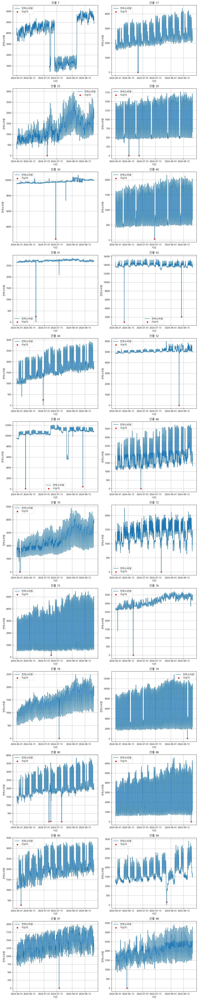

In [28]:
plot_all_buildings_with_outliers(train, big_drops, n_cols=2, height=5)

7번 건물=> 감소 구간을 모두 이상치로 간주하기엔 범위가 넓고, 내부 패턴이 존재함  
모두 이상치로 간주해 보정을 하지 않고, 가중치를 감소 시킴

In [32]:
def detect_level_segments(df_b, threshold_ratio=0.6, min_duration_hours=6):

    df = df_b.sort_values('datetime').copy()
    df = df.set_index('datetime')

    # baseline: 앞 5일 평균
    baseline = df['전력소비량'].iloc[:24*5].mean()
    threshold = baseline * threshold_ratio

    # low 구간 여부
    df['low'] = df['전력소비량'] < threshold

    segments = []
    in_segment = False
    seg_start = None

    for t, is_low in df['low'].items():
        if is_low and not in_segment:
            # 시작점
            in_segment = True
            seg_start = t

        elif not is_low and in_segment:
            # 종료점
            seg_end = t
            duration = (seg_end - seg_start).total_seconds() / 3600

            if duration >= min_duration_hours:
                segments.append((seg_start, seg_end))

            in_segment = False
            seg_start = None

    # 마지막 구간이 끝까지 이어진 경우
    if in_segment:
        seg_end = df.index[-1]
        duration = (seg_end - seg_start).total_seconds() / 3600

        if duration >= min_duration_hours:
            segments.append((seg_start, seg_end))

    return segments



In [33]:
df7 = train[train['건물번호']==7]
segments = detect_level_segments(df7, threshold_ratio=0.6, min_duration_hours=8)

for i,(s,e) in enumerate(segments,1):
    print(f"{i} 감소 구간: {s} ~ {e}")

1 감소 구간: 2024-07-07 10:00:00 ~ 2024-07-08 12:00:00
2 감소 구간: 2024-07-12 14:00:00 ~ 2024-08-06 03:00:00


In [34]:
train["weight"] = 1.0

low_weight = 0.3

for (s, e) in segments:
    mask = (
        (train["건물번호"] == 7) &
        (train["datetime"] >= s) &
        (train["datetime"] <= e)
    )
    train.loc[mask, "weight"] = low_weight

# 확인용
print("건물 7 전체 row 수:", (train["건물번호"] == 7).sum())
print("건물 7 중 weight 낮춘 row 수:", ((train["건물번호"] == 7) & (train["weight"] == low_weight)).sum())

건물 7 전체 row 수: 2040
건물 7 중 weight 낮춘 row 수: 617


1차 dig drops 구간 전처리

In [35]:
def print_segment_summary(segments):
    print(f"전체 연속 이상치 구간 개수 : {len(segments)}\n")

    # DataFrame 변환
    seg_df = pd.DataFrame(segments)

    # 건물번호별 개수
    print("건물별 이상치 구간 개수:")
    print(seg_df.groupby("건물번호").size())
    print()

    # 예시 몇 개만 표시
    print("예시 구간 5개:")
    print(seg_df.head())

In [36]:
segments = detect_segments_from_bigdrops(train, big_drops)
print_segment_summary(segments)


전체 연속 이상치 구간 개수 : 29

건물별 이상치 구간 개수:
건물번호
7     1
17    1
25    1
29    2
30    1
40    1
41    1
43    2
44    1
52    1
67    2
68    1
70    1
72    1
73    1
76    1
78    1
79    1
80    3
88    1
90    1
94    1
97    1
98    1
dtype: int64

예시 구간 5개:
   건물번호               start                 end
0     7 2024-07-07 10:00:00 2024-07-08 12:00:00
1    17 2024-06-25 16:00:00 2024-06-26 09:00:00
2    25 2024-07-04 12:00:00 2024-07-04 15:00:00
3    29 2024-06-15 22:00:00 2024-06-16 09:00:00
4    29 2024-06-27 00:00:00 2024-06-27 02:00:00


In [37]:
def expand_segments(segments, hours_before=1, hours_after=0):
    expanded = []
    for seg in segments:
        new_seg = seg.copy()
        new_seg["start"] = seg["start"] - pd.Timedelta(hours=hours_before)
        new_seg["end"]   = seg["end"]   + pd.Timedelta(hours=hours_after)
        expanded.append(new_seg)
    return expanded

segments_expanded = expand_segments(segments, hours_before=1, hours_after=0)


In [38]:
def fill_segments(train, segments, method="linear"):
    """
    segments 구간을 앞/뒤 정상값 기반으로 보간하여 채운다.
    method = 'linear' 또는 'average'
    """

    df = train.copy().sort_values(['건물번호', 'datetime'])
    df['datetime'] = pd.to_datetime(df['datetime'])

    for seg in segments:
        b = seg['건물번호']
        start = seg['start']
        end   = seg['end']

        # 건물 7은 건너뛰기
        if b == 7:
            continue

        df_b = df[df['건물번호'] == b]

        # 구간 인덱스
        mask = (df['건물번호']==b) & (df['datetime'] >= start) & (df['datetime'] <= end)
        idxs = df.index[mask]

        # 구간 양끝 정상값
        prev_idx = idxs.min() - 1
        next_idx = idxs.max() + 1

        if prev_idx < 0 or next_idx >= len(df):
            continue
        
        prev_val = df.loc[prev_idx, '전력소비량']
        next_val = df.loc[next_idx, '전력소비량']

        if method == "average":
            fill_value = (prev_val + next_val) / 2
            df.loc[idxs, '전력소비량'] = fill_value

        elif method == "linear":
            # 선형보간
            df.loc[idxs, '전력소비량'] = np.linspace(prev_val, next_val, len(idxs)+2)[1:-1]

    return df


In [39]:
train_filled = fill_segments(train, segments_expanded, method="linear")

In [40]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_before_after(train, train_filled, building_num, segments=None):
    """
    특정 건물의 전력소비량을 보간 전/후로 비교하여 그래프로 출력하는 함수.
    segments가 주어지면 이상치 구간도 음영(shade)처리해 표시한다.
    """

    # 해당 건물만 추출
    df_before = (
        train[train["건물번호"] == building_num]
        .sort_values("datetime")
        .reset_index(drop=True)
    )

    df_after = (
        train_filled[train_filled["건물번호"] == building_num]
        .sort_values("datetime")
        .reset_index(drop=True)
    )

    plt.figure(figsize=(14,6))

    # Before (원본)
    plt.plot(df_before["datetime"], df_before["전력소비량"],
             label="Before (original)", color="red", alpha=0.6)

    # After (보간 후)
    plt.plot(df_after["datetime"], df_after["전력소비량"],
             label="After (filled)", color="blue", alpha=0.8)

    # 이상치 구간 shade 표시 (optional)
    if segments is not None:
        for seg in segments:
            if seg["건물번호"] == building_num:
                plt.axvspan(seg["start"], seg["end"],
                            color="gray", alpha=0.2)

    plt.title(f"Building {building_num} - Before vs After Filling")
    plt.xlabel("Datetime")
    plt.ylabel("Power Consumption")
    plt.legend()
    plt.grid(True)
    plt.show()


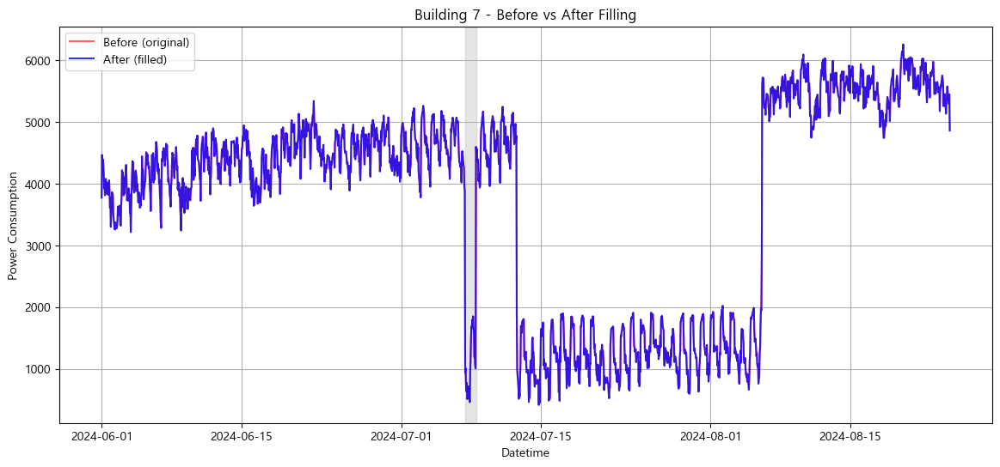

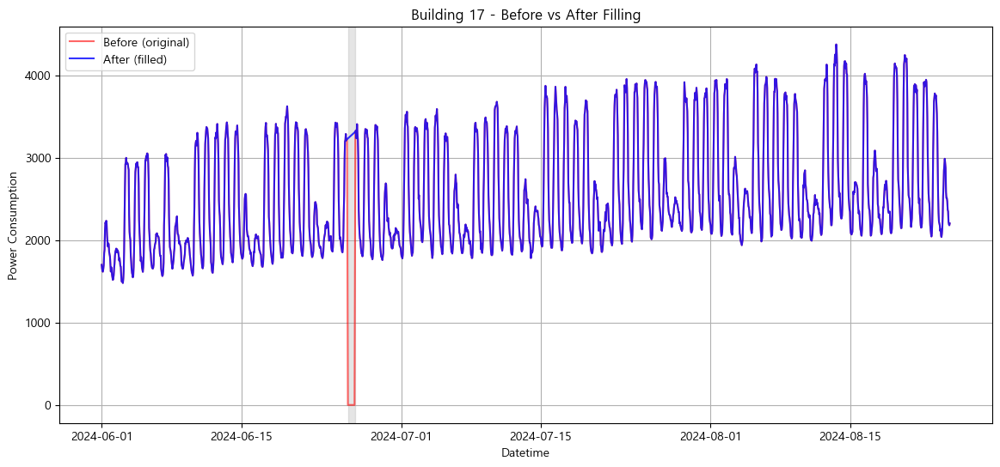

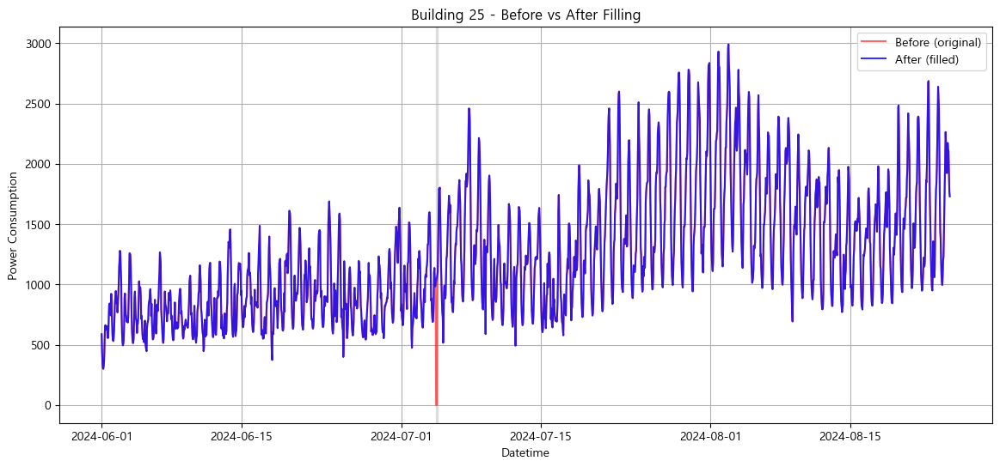

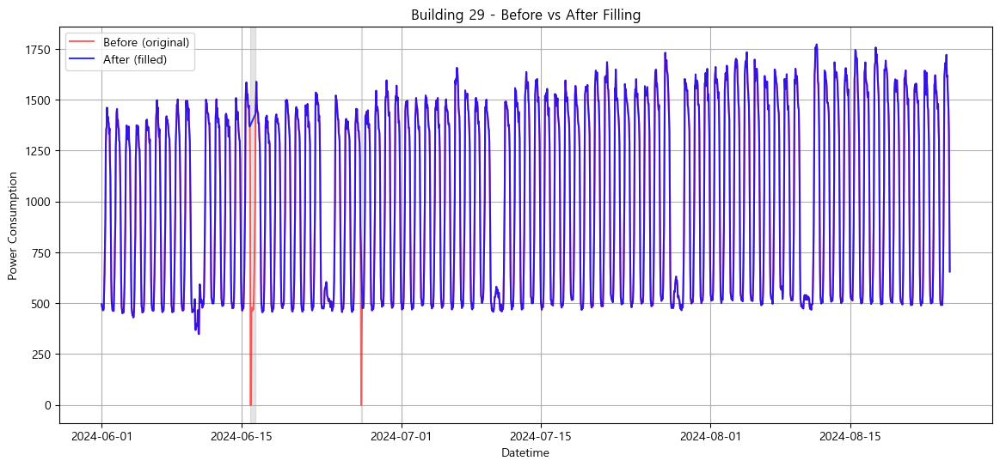

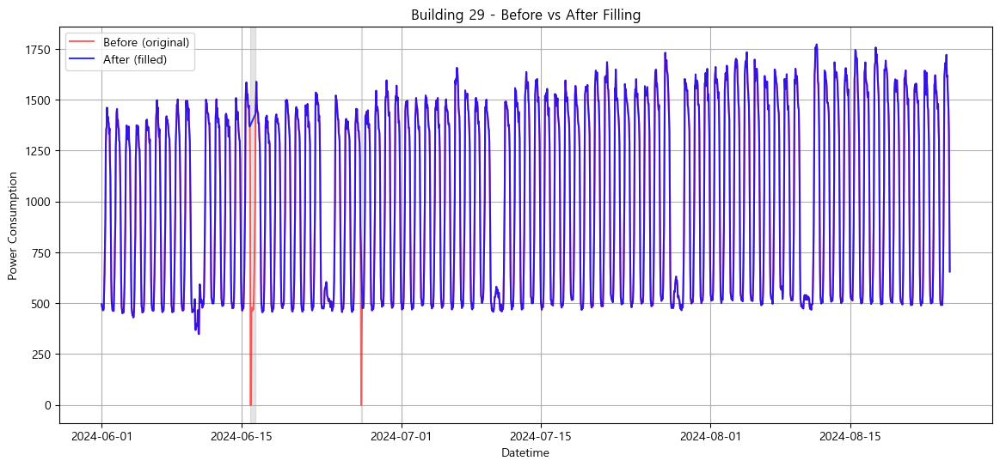

...

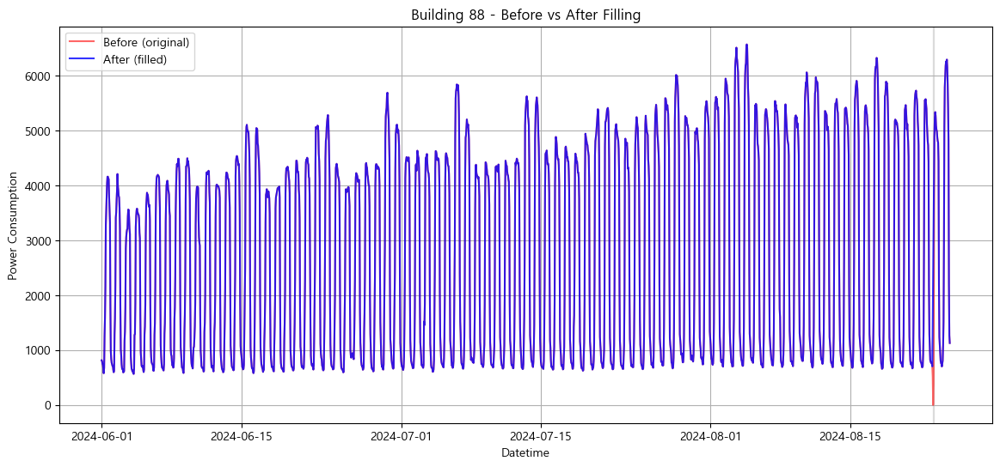

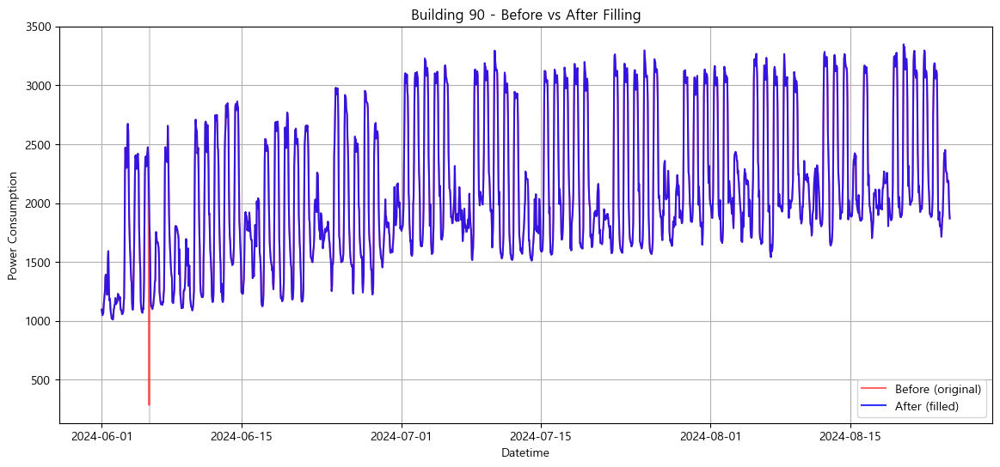

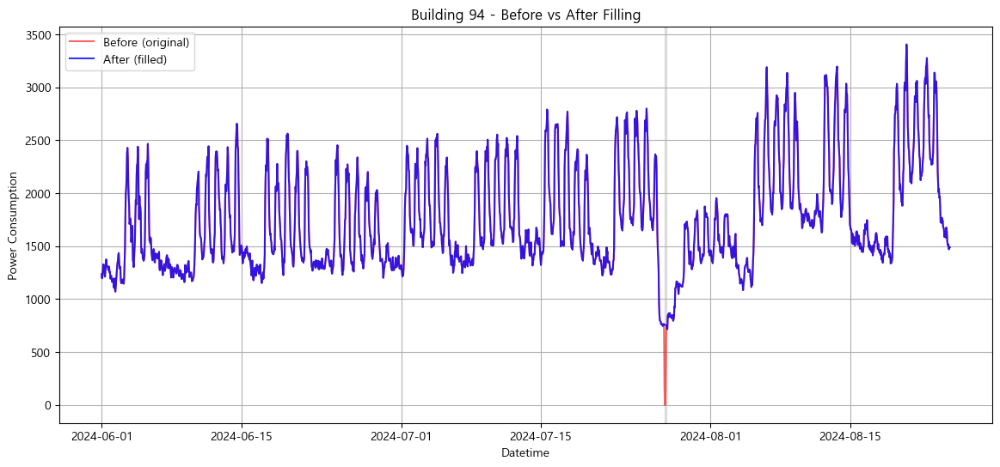

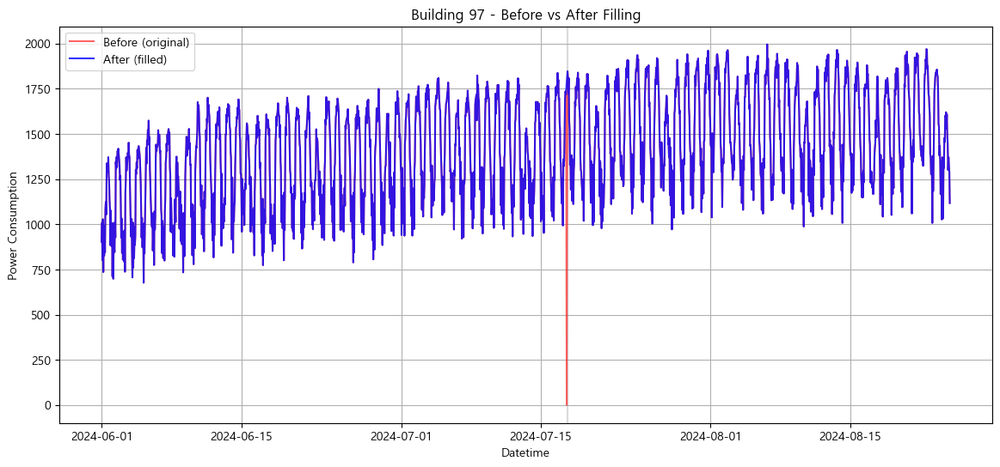

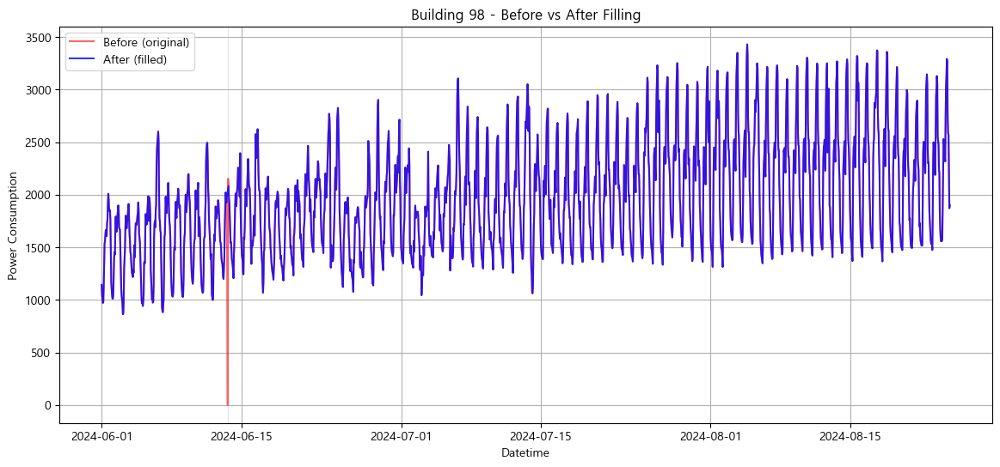

In [41]:
for b in big_drops["건물번호"]:
    plot_before_after(train, train_filled, building_num=b, segments=segments)


In [42]:
train_filled.head()

,numdatetime,건물번호,일시,기온,강수량,풍속,습도,일조,일사,전력소비량,datetime,hour,day,weekday,is_weekend,month,건물유형,연면적,냉방면적,태양광용량,ESS저장용량,PCS용량,연면적_log,냉방면적_log,weight
0,1_20240601 00,1,20240601 00,18.3,0.0,2.6,82.0,0.0,0.0,5794.80,2024-06-01 00:00:00,0,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN,11.325556,11.259155,1.0
1,1_20240601 01,1,20240601 01,18.3,0.0,2.7,82.0,0.0,0.0,5591.85,2024-06-01 01:00:00,1,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN,11.325556,11.259155,1.0
2,1_20240601 02,1,20240601 02,18.1,0.0,2.6,80.0,0.0,0.0,5338.17,2024-06-01 02:00:00,2,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN,11.325556,11.259155,1.0
3,1_20240601 03,1,20240601 03,18.0,0.0,2.6,81.0,0.0,0.0,4554.42,2024-06-01 03:00:00,3,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN,11.325556,11.259155,1.0
4,1_20240601 04,1,20240601 04,17.8,0.0,1.3,81.0,0.0,0.0,3602.25,2024-06-01 04:00:00,4,1,5,1,6,호텔,82912.71,77586.0,NaN,NaN,NaN,11.325556,11.259155,1.0


In [44]:

def plot_all_buildings_with_all_outliers(df, big_drop_df, low_outlier_df,
                                        target_col="전력소비량",
                                        ncols=4, figsize=(20, 4)):
    
    buildings = sorted(df["건물번호"].unique())
    n = len(buildings)
    nrows = (n + ncols - 1) // ncols

    plt.figure(figsize=(figsize[0], figsize[1] * nrows))

    for i, b in enumerate(buildings, 1):
        ax = plt.subplot(nrows, ncols, i)

        df_b = df[df["건물번호"] == b]
        bd_b = big_drop_df[big_drop_df["건물번호"] == b]
        lo_b = low_outlier_df[low_outlier_df["건물번호"] == b]

        # 전체 전력 시계열
        ax.plot(df_b["datetime"], df_b[target_col], color="gray", alpha=0.7, label="original")

        # 1차 이상치(big_drop)
        ax.scatter(bd_b["datetime"], bd_b[target_col], color="red", s=12, label="big_drop outlier")

        # 2차 이상치(rolling 대비 low + zero)
        ax.scatter(lo_b["datetime"], lo_b[target_col], color="blue", s=12, label="low/zero outlier")

        ax.set_title(f"건물 {b}")
        
        ax.tick_params(axis="x", rotation=45)

    plt.tight_layout()
    plt.show()


In [55]:
def detect_low_and_zero_outliers(df, target_col="전력소비량", threshold_ratio=0.2):
    df = df.copy()
    df = df.sort_values(["건물번호", "datetime"])

    # rolling 24 mean (shift(1) 적용)
    df["roll_mean_24"] = (
        df.groupby("건물번호")[target_col]
          .apply(lambda x: x.shift(1).rolling(24, min_periods=1).mean())
          .reset_index(level=0, drop=True)
    )

    cond_zero = df[target_col] == 0
    cond_low = df[target_col] < df["roll_mean_24"] * threshold_ratio
    df["prev_power"] = df.groupby("건물번호")["전력소비량"].shift(1)
    df["next_power"] = df.groupby("건물번호")["전력소비량"].shift(-1)

    df["local_mean"] = (df["prev_power"] + df["next_power"]) / 2

    # 규칙: 전후 평균 대비 40% 이하 → 이상치
    local_mask = (df["전력소비량"] < df["local_mean"] * 0.5)

    df["is_low_outlier"] = cond_zero | cond_low | local_mask

    print("2차 이상치 개수:", df["is_low_outlier"].sum())

    return df[df["is_low_outlier"]].copy()


2차 이상치 개수: 260


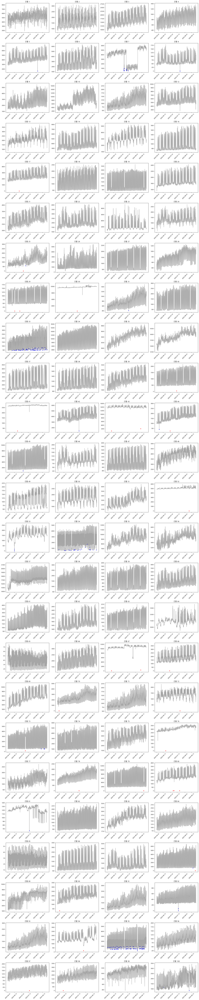

In [56]:
low_outliers = detect_low_and_zero_outliers(train_filled)

plot_all_buildings_with_all_outliers(
    df=train_filled,
    big_drop_df=big_drops,
    low_outlier_df=low_outliers
)

In [57]:
df = train_filled.copy()

# 7번, 95번 제외
df_clean = df[~df["건물번호"].isin([7,25, 33, 54, 73,88, 95])].copy()

# 임시 rolling mean 생성
df_clean["roll_mean_24"] = (
    df_clean.groupby("건물번호")["전력소비량"]
           .transform(lambda x: x.shift(1).rolling(24, min_periods=1).mean())
)

In [58]:
outlier_mask = (
    (df_clean["전력소비량"] == 0) |
    (df_clean["전력소비량"] < df_clean["roll_mean_24"] * 0.2)
)


In [59]:
df_clean.loc[outlier_mask, "전력소비량"] = df_clean.loc[outlier_mask, "roll_mean_24"]


In [60]:
building_non = df[df["건물번호"].isin([7,25, 33, 54, 73,88, 95])]

train_after_fix = pd.concat([df_clean, building_non]).sort_values(["건물번호", "datetime"])


In [61]:

def plot_before_after_building(original_df, fixed_df, building_num, title_suffix=""):


    # 건물별 데이터 추출
    df_before = original_df[original_df["건물번호"] == building_num].sort_values("datetime")
    df_after  = fixed_df[fixed_df["건물번호"] == building_num].sort_values("datetime")

    plt.figure(figsize=(16, 5))

    # 보정 전
    plt.plot(df_before["datetime"], df_before["전력소비량"], 
             label="Before (original)", color="red", alpha=0.6)

    # 보정 후
    plt.plot(df_after["datetime"], df_after["전력소비량"], 
             label="After (corrected)", color="blue", linewidth=1.5)

    plt.title(f"건물 {building_num} - Before vs After {title_suffix}")
    plt.xlabel("Datetime")
    plt.ylabel("Power Consumption")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


보정된 건물 목록: [ 8 45 53 92]


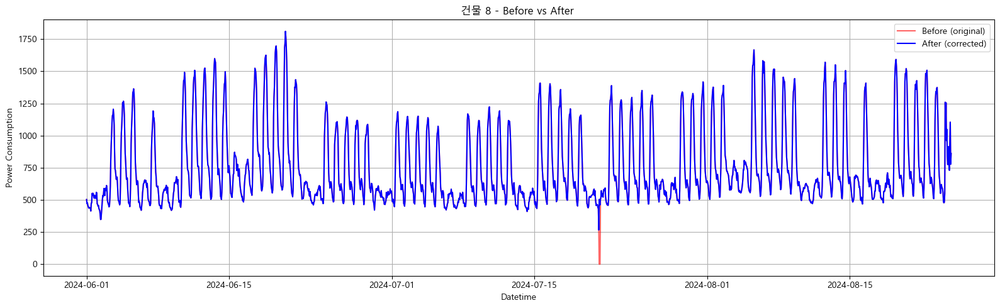

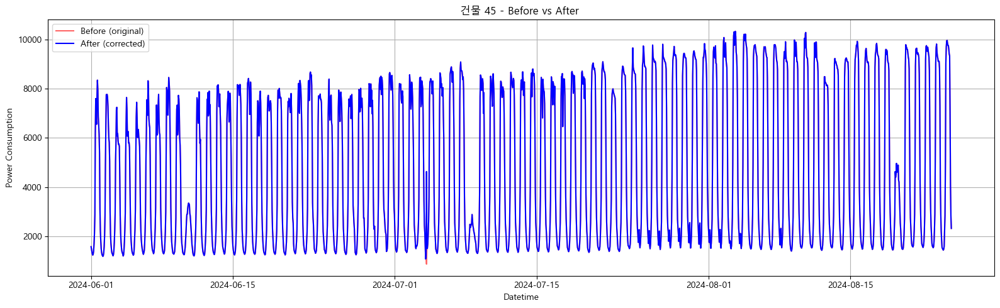

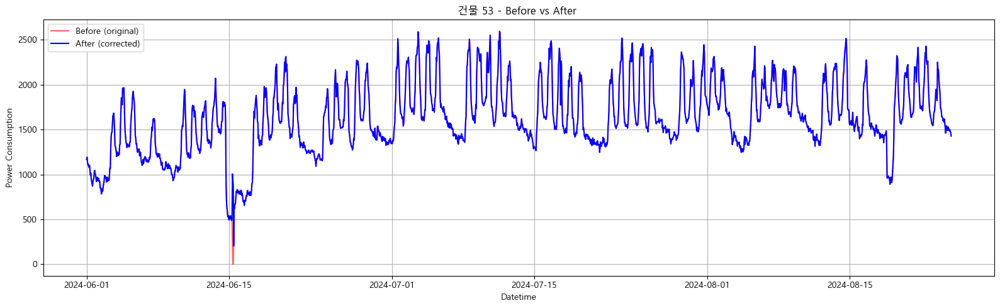

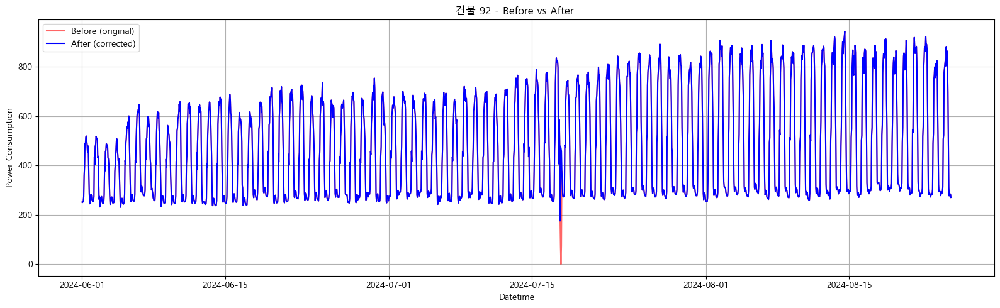

In [62]:
# 보정된 변화가 있는 건물만 선택
changed_buildings = (
    train_filled["전력소비량"].values != train_after_fix["전력소비량"].values
)

# 건물번호 단위로 변화 여부 판단
changed_building_nums = train_filled.loc[changed_buildings, "건물번호"].unique()

print("보정된 건물 목록:", changed_building_nums)

# 변화가 있는 건물만 그래프 출력
for b in changed_building_nums:
    plot_before_after_building(train_filled, train_after_fix, b)


In [ ]:
# 보정된 변화가 있는 건물만 선택
changed_buildings = (
    train_filled["전력소비량"].values != train_after_fix["전력소비량"].values
)

# 건물번호 단위로 변화 여부 판단
changed_building_nums = train_filled.loc[changed_buildings, "건물번호"].unique()

print("보정된 건물 목록:", changed_building_nums)

# 변화가 있는 건물만 그래프 출력
for b in changed_building_nums:
    plot_before_after_building(train_filled, train_after_fix, b)


In [ ]:

df_clean = train_filled[~train_filled["건물번호"].isin([7,25, 33, 54, 73,88, 95])].copy()


In [64]:
train_after_fix.info()

<class 'pandas.core.frame.DataFrame'>
Index: 204000 entries, 0 to 203999
Data columns (total 26 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   numdatetime   204000 non-null  object        
 1   건물번호          204000 non-null  int64         
 2   일시            204000 non-null  object        
 3   기온            204000 non-null  float64       
 4   강수량           204000 non-null  float64       
 5   풍속            204000 non-null  float64       
 6   습도            204000 non-null  float64       
 7   일조            204000 non-null  float64       
 8   일사            204000 non-null  float64       
 9   전력소비량         204000 non-null  float64       
 10  datetime      204000 non-null  datetime64[ns]
 11  hour          204000 non-null  int32         
 12  day           204000 non-null  int32         
 13  weekday       204000 non-null  int32         
 14  is_weekend    204000 non-null  int32         
 15  month         204000 n

In [70]:
train_weighted = train_after_fix.copy()


# 원본과 보정 후의 값이 달라진 row 찾기
changed_mask = (
    (train_row["전력소비량(kWh)"].values != train_after_fix["전력소비량"].values)
)

# 건물 7은 제외
changed_mask = changed_mask & (train_after_fix["건물번호"].values != 7)

# 값 변경된 row → weight 낮추기
train_weighted.loc[changed_mask, "weight"] = 0.7


In [71]:
train_weighted["weight"].value_counts()

weight
1.0    203194
0.3       617
0.7       189
Name: count, dtype: int64

In [72]:
train_weighted.columns

Index(['numdatetime', '건물번호', '일시', '기온', '강수량', '풍속', '습도', '일조', '일사',
       '전력소비량', 'datetime', 'hour', 'day', 'weekday', 'is_weekend', 'month',
       '건물유형', '연면적', '냉방면적', '태양광용량', 'ESS저장용량', 'PCS용량', '연면적_log',
       '냉방면적_log', 'weight', 'roll_mean_24'],
      dtype='object')

In [75]:
train_dl = train_weighted.drop(columns=["roll_mean_24"])

이상치 처리 완료

In [76]:
test_dl = test.copy()

In [78]:
#필요없는 칼럼 제거
drop_col1 = ["numdatetime", "연면적", "냉방면적","일조","일사"]
drop_col2 = ["numdatetime", "연면적", "냉방면적"]
train_dl = train_dl.drop(columns=drop_col1)
test_dl = test_dl.drop(columns=drop_col2)

In [79]:
train_dl.head()

,건물번호,일시,기온,강수량,풍속,습도,전력소비량,datetime,hour,day,weekday,is_weekend,month,건물유형,태양광용량,ESS저장용량,PCS용량,연면적_log,냉방면적_log,weight
0,1,20240601 00,18.3,0.0,2.6,82.0,5794.80,2024-06-01 00:00:00,0,1,5,1,6,호텔,NaN,NaN,NaN,11.325556,11.259155,1.0
1,1,20240601 01,18.3,0.0,2.7,82.0,5591.85,2024-06-01 01:00:00,1,1,5,1,6,호텔,NaN,NaN,NaN,11.325556,11.259155,1.0
2,1,20240601 02,18.1,0.0,2.6,80.0,5338.17,2024-06-01 02:00:00,2,1,5,1,6,호텔,NaN,NaN,NaN,11.325556,11.259155,1.0
3,1,20240601 03,18.0,0.0,2.6,81.0,4554.42,2024-06-01 03:00:00,3,1,5,1,6,호텔,NaN,NaN,NaN,11.325556,11.259155,1.0
4,1,20240601 04,17.8,0.0,1.3,81.0,3602.25,2024-06-01 04:00:00,4,1,5,1,6,호텔,NaN,NaN,NaN,11.325556,11.259155,1.0


In [80]:
for col in ["태양광용량", "ESS저장용량", "PCS용량"]:
    train_dl[f"{col}_exists"] = train_dl[col].notna().astype(int)
    train_dl[col] = train_dl[col].fillna(0)

In [81]:
for col in ["태양광용량", "ESS저장용량", "PCS용량"]:
    test_dl[f"{col}_exists"] = test_dl[col].notna().astype(int)
    test_dl[col] = test[col].fillna(0)

In [82]:
train_dl['불쾌지수'] = 1.8 * train['기온'] - 0.55 * (1 - train['습도'] / 100) * (1.8 * train['기온'] - 26) + 32
test_dl['불쾌지수'] = 1.8 *test['기온'] - 0.55 * (1 - test['습도'] / 100) * (1.8 * test['기온'] - 26) + 32

In [83]:
def add_feels_like(df):
    T = df["기온"]
    V = df["풍속"].clip(lower=0.1)
    feels = 13.12 + 0.6215*T - 11.37*(V**0.16) + 0.3965*T*(V**0.16)
    return feels       # ✔ Series만 반환

In [84]:
train_dl["체감온도"] = add_feels_like(train_dl)
test_dl["체감온도"] = add_feels_like(test_dl)

In [85]:
train_dl["hour_sin"] = np.sin(2 * np.pi * train_dl["hour"] / 24) 
train_dl["hour_cos"] = np.cos(2 * np.pi * train_dl["hour"] / 24)

test_dl["hour_sin"] = np.sin(2 * np.pi * test_dl["hour"] / 24) 
test_dl["hour_cos"] = np.cos(2 * np.pi * test_dl["hour"] / 24)

In [86]:
train_dl["week_sin"] = np.sin(2 * np.pi * train_dl["weekday"] / 7)
train_dl["week_cos"] = np.cos(2 * np.pi * train_dl["weekday"] / 7)

test_dl["week_sin"] = np.sin(2 * np.pi * test_dl["weekday"] / 7)
test_dl["week_cos"] = np.cos(2 * np.pi * test_dl["weekday"] / 7)

스케일링

In [87]:
from sklearn.preprocessing import MinMaxScaler

scaler_cols = ["기온", "강수량", "풍속", "습도",
               "연면적_log", "냉방면적_log","day",	"month",
               "태양광용량", "ESS저장용량", "PCS용량","불쾌지수", "체감온도"]

scaler = MinMaxScaler()
train_dl[scaler_cols] = scaler.fit_transform(train_dl[scaler_cols])
test_dl[scaler_cols]=scaler.transform(test_dl[scaler_cols])

In [88]:
y_scalers = {}

for b in train_dl["건물번호"].unique():
    scaler = MinMaxScaler()
    b_idx = train_dl["건물번호"] == b
    train_dl.loc[b_idx, "전력소비량"]=scaler.fit_transform(train_dl.loc[b_idx, ["전력소비량"]])
    y_scalers[b]=scaler

In [ ]:
scale_info = []

for b_id, df_b in train_after_fix.groupby("건물번호"):
    y = df_b["전력소비량"].sort_values()

    # 작은 3개, 큰 3개 평균
    min2 = y.iloc[:3].mean()
    max2 = y.iloc[-3:].mean()

    scale_info.append({
        "건물번호": b_id,
        "min": min2,
        "max": max2
    })

scale_info = pd.DataFrame(scale_info)


In [90]:
scale_info.head(10)

,건물번호,min,max
0,1,2183.590000,8068.220000
1,2,795.560000,3127.320000
2,3,9100.140000,26909.300000
3,4,381.040000,1366.040000
4,5,2356.640000,7339.520000
5,6,1125.440000,6348.000000
6,7,439.646667,6188.056667
7,8,320.400000,1763.800000
8,9,1072.603333,5320.766667
9,10,2010.020000,16582.286667


In [91]:
scale_info.to_csv("b_scale_m_info.csv", index=False)

In [92]:
train_dl.head()

,건물번호,일시,기온,강수량,풍속,습도,전력소비량,datetime,hour,day,weekday,is_weekend,month,건물유형,태양광용량,ESS저장용량,PCS용량,연면적_log,냉방면적_log,weight,태양광용량_exists,ESS저장용량_exists,PCS용량_exists,불쾌지수,체감온도,hour_sin,hour_cos,week_sin,week_cos
0,1,20240601 00,0.326733,0.0,0.171053,0.82,0.630237,2024-06-01 00:00:00,0,0.0,5,1,0.0,호텔,0.0,0.0,0.0,0.365115,0.627371,1.0,0,0,0,0.390428,0.262497,0.000000,1.000000,-0.974928,-0.222521
1,1,20240601 01,0.326733,0.0,0.177632,0.82,0.597644,2024-06-01 01:00:00,1,0.0,5,1,0.0,호텔,0.0,0.0,0.0,0.365115,0.627371,1.0,0,0,0,0.390428,0.261524,0.258819,0.965926,-0.974928,-0.222521
2,1,20240601 02,0.320132,0.0,0.171053,0.80,0.556904,2024-06-01 02:00:00,2,0.0,5,1,0.0,호텔,0.0,0.0,0.0,0.365115,0.627371,1.0,0,0,0,0.381161,0.255237,0.500000,0.866025,-0.974928,-0.222521
3,1,20240601 03,0.316832,0.0,0.171053,0.81,0.431037,2024-06-01 03:00:00,3,0.0,5,1,0.0,호텔,0.0,0.0,0.0,0.365115,0.627371,1.0,0,0,0,0.378241,0.251607,0.707107,0.707107,-0.974928,-0.222521
4,1,20240601 04,0.310231,0.0,0.085526,0.81,0.278122,2024-06-01 04:00:00,4,0.0,5,1,0.0,호텔,0.0,0.0,0.0,0.365115,0.627371,1.0,0,0,0,0.370710,0.262018,0.866025,0.500000,-0.974928,-0.222521


In [93]:

def generate_building_lag_roll(df, target_col="전력소비량"):
    df = df.copy()
    
    #재정렬
    df = df.sort_values(["건물번호", "datetime"]).reset_index(drop=True)
    
    # 건물별로groupby
    df["lag_1"] = df.groupby("건물번호")[target_col].shift(1)
    df["lag_24"] = df.groupby("건물번호")[target_col].shift(24)
    df["lag_168"] = df.groupby("건물번호")[target_col].shift(168)

    df["roll_m_6"] = df.groupby("건물번호")[target_col].transform(lambda x: x.shift(1).rolling(6).mean())
    df["roll_m_24"] = df.groupby("건물번호")[target_col].transform(lambda x: x.shift(1).rolling(24).mean())
    
    df["roll_s_24"] = df.groupby("건물번호")[target_col].transform(lambda x: x.shift(1).rolling(24).std())


    return df

train_dl = generate_building_lag_roll(train_dl)

In [94]:
#test에서는 없으니까 일단 널
test_dl["lag_1"] = np.nan
test_dl["lag_24"] = np.nan
test_dl["lag_168"] = np.nan
test_dl["roll_m_6"] = np.nan
test_dl["roll_m_24"]= np.nan
test_dl["roll_s_24"] = np.nan

In [95]:
train_dl[['lag_1', 'lag_24','lag_168', 'roll_m_6', 'roll_m_24','roll_s_24']] = train_dl[['lag_1', 'lag_24','lag_168', 'roll_m_6', 'roll_m_24','roll_s_24']].fillna(method='bfill')

C:\Users\leehy\AppData\Local\Temp\ipykernel_1580\3732756027.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  train_dl[['lag_1', 'lag_24','lag_168', 'roll_m_6', 'roll_m_24','roll_s_24']] = train_dl[['lag_1', 'lag_24','lag_168', 'roll_m_6', 'roll_m_24','roll_s_24']].fillna(method='bfill')


In [96]:
train_dl = train_dl.drop(columns=["hour","weekday"])

In [100]:
test_dl = test_dl.drop(columns=["hour","weekday"])

In [101]:
test_dl.columns

Index(['건물번호', '일시', '기온', '강수량', '풍속', '습도', 'datetime', 'day', 'is_weekend',
       'month', '건물유형', '태양광용량', 'ESS저장용량', 'PCS용량', '연면적_log', '냉방면적_log',
       '태양광용량_exists', 'ESS저장용량_exists', 'PCS용량_exists', '불쾌지수', '체감온도',
       'hour_sin', 'hour_cos', 'week_sin', 'week_cos', 'lag_1', 'lag_24',
       'lag_168', 'roll_m_6', 'roll_m_24', 'roll_s_24'],
      dtype='object')

In [102]:
train_dl.columns

Index(['건물번호', '일시', '기온', '강수량', '풍속', '습도', '전력소비량', 'datetime', 'day',
       'is_weekend', 'month', '건물유형', '태양광용량', 'ESS저장용량', 'PCS용량', '연면적_log',
       '냉방면적_log', 'weight', '태양광용량_exists', 'ESS저장용량_exists', 'PCS용량_exists',
       '불쾌지수', '체감온도', 'hour_sin', 'hour_cos', 'week_sin', 'week_cos', 'lag_1',
       'lag_24', 'lag_168', 'roll_m_6', 'roll_m_24', 'roll_s_24'],
      dtype='object')

In [103]:
train_dl = pd.get_dummies(train_dl, columns=['건물유형'], drop_first=True)
test_dl = pd.get_dummies(test_dl, columns=['건물유형'], drop_first=True)

In [104]:
train_dl.to_csv("train_d.csv", index=False)
test_dl.to_csv("test_d.csv", index=False)